### 1. Libraries

In [1]:
import pandas as pd
import numpy as np
from pandas.plotting import scatter_matrix
from sklearn.ensemble import IsolationForest
import matplotlib
from matplotlib import pyplot as plt

### 2. Data Import and Formatting
#### 2.1 Import

In [2]:
beers_data = pd.read_excel("datasets/beers.xlsx")

Zaimportowanie danych. Źródło: https://www.kaggle.com/ruthgn/beer-profile-and-ratings-data-set <br>

1 - Name: Nazwa piwa <br>
2 - Style: Styl piwa <br>
3 - Brewery:  Nazwa browaru <br>
4 - Beer Name (Full): Złączenie Name + Style + Brewery <br>
5 - Description: Notatki na temat piwa- jeśli dostępne <br>
6 - ABV: Alkohol zawarty w piwie (% objętości) <br>
7 - Min IBU: Minimalna wartość IBU, jaką może posiadać każde piwo (określa stopień nachmielenia piwa) <br>
8 - Max IBU: Maksymalna wartość IBU, jaką może posiadać każde piwo <br>

Kolejne jedenaście kolumn przedstawia cechy profilu degustacyjnego piwa i są zdefiniowane przez liczbę słów znalezioną w maksymalnie 25 recenzjach każdego piwa. Założenie jest takie, że ludzie piszący recenzje z większym prawdopodobieństwem opisują to, czego doświadczają, a nie to, czego nie doświadczają. (Do danych dołączone są również pliki z listą słów używanych do obliczania wartości zawartych w każdej z kolumn cech poniżej.) <br>


(Mouthfeel) <br>
9 - Astringency - cierpkość <br>
10 - Body - Ciało piwa charakteryzuje pełnia smaku i odczucie w ustach, a deskryptory wahają się od wodnistych lub pozbawionych charakteru do sycących lub gęstych.<br>
11 - Alcohol <br>

(Taste) <br>
12 - Bitter <br> 
13 - Sweet <br>
14 - Sour <br>
15 - Salty <br>

(Flavor And Aroma) <br>
16 - Fruits <br>
17 - Hoppy <br>
18 - Spices <br>
19 - Malty - słodowy <br>

Ostatnie sześć kolumn zawiera informacje z recenzji piwa — obejmują one liczbę recenzji konsumentów/użytkowników, średnią ogólną ocenę oraz średnią ocenę zapachu, wyglądu, podniebienia i smaku każdego piwa. <br>

20 - review _ aroma <br>
21 - review _ appearance <br>
22 - review _ palate <br>
23 - review _ taste <br>
24 - review _ overall <br>
25 - number _ of _ reviews 

#### 2.2 Formatting
Usunięcie kolumny 'Description', ponieważ dane typu string zawarte w tej kolumnie nie mogą być łatwo przetłumaczone na dane liczbowe bądź etykiety- wymagałoby to zastosowania algorytmów NLP. <br>

Usunięcie kolumny 'Beer Name (Full)', ponieważ jest ona zlepkiem kolumn 'Name', 'Brewery' i 'Style'- sama w sobie nie dostarcza żadnej nowej informacji. <br>

Ustawienie indeksu na ['Name', 'Brewery', 'Style'], ponieważ chcemy, żeby każdy indeks był unikalny, a dodatkowo chcemy zachować te kolumny do dalszej analizy, np. do problemu klasyfikacji.



In [3]:
beers_data.head()

,Name,Style,Brewery,Beer Name (Full),Description,ABV,Min IBU,Max IBU,Astringency,Body,...,Fruits,Hoppy,Spices,Malty,review_aroma,review_appearance,review_palate,review_taste,review_overall,number_of_reviews
0,Amber,Altbier,Alaskan Brewing Co.,Alaskan Brewing Co. Alaskan Amber,"Notes:Richly malty and long on the palate, wit...",5.3,25,50,13,32,...,33,57,8,111,3.498994,3.636821,3.556338,3.643863,3.847082,497
1,Double Bag,Altbier,Long Trail Brewing Co.,Long Trail Brewing Co. Double Bag,"Notes:This malty, full-bodied double alt is al...",7.2,25,50,12,57,...,24,35,12,84,3.798337,3.846154,3.904366,4.024948,4.034304,481
2,Long Trail Ale,Altbier,Long Trail Brewing Co.,Long Trail Brewing Co. Long Trail Ale,Notes:Long Trail Ale is a full-bodied amber al...,5.0,25,50,14,37,...,10,54,4,62,3.409814,3.667109,3.600796,3.631300,3.830239,377
3,Doppelsticke,Altbier,Uerige Obergärige Hausbrauerei GmbH / Zum Uerige,Uerige Obergärige Hausbrauerei GmbH / Zum Ueri...,Notes:,8.5,25,50,13,55,...,49,40,16,119,4.148098,4.033967,4.150815,4.205163,4.005435,368
4,Sleigh'r Dark Doüble Alt Ale,Altbier,Ninkasi Brewing Company,Ninkasi Brewing Company Sleigh'r Dark Doüble A...,Notes:Called 'Dark Double Alt' on the label.Se...,7.2,25,50,25,51,...,11,51,20,95,3.625000,3.973958,3.734375,3.765625,3.817708,96


In [4]:
beers_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3197 entries, 0 to 3196
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               3197 non-null   object 
 1   Style              3197 non-null   object 
 2   Brewery            3197 non-null   object 
 3   Beer Name (Full)   3197 non-null   object 
 4   Description        3197 non-null   object 
 5   ABV                3197 non-null   float64
 6   Min IBU            3197 non-null   int64  
 7   Max IBU            3197 non-null   int64  
 8   Astringency        3197 non-null   int64  
 9   Body               3197 non-null   int64  
 10  Alcohol            3197 non-null   int64  
 11  Bitter             3197 non-null   int64  
 12  Sweet              3197 non-null   int64  
 13  Sour               3197 non-null   int64  
 14  Salty              3197 non-null   int64  
 15  Fruits             3197 non-null   int64  
 16  Hoppy              3197 

In [5]:
beers_data.drop(columns = ['Description'] , inplace=True)

In [6]:
len(beers_data['Name'].unique()) #nie możemy użyć 'Name' jako 
len(beers_data['Beer Name (Full)'].unique()) #ok

3197

In [7]:
beers_data.drop(columns = ['Beer Name (Full)'] , inplace=True)

In [8]:
beers_data[['Name', 'Brewery', 'Style']].drop_duplicates()
beers_data.set_index(['Name', 'Brewery', 'Style'], inplace=True)

### 3. Exploratory Data Analysis
#### 3.1 General

Tworzymy scatter_matrix dla wszystkich cech, tzn. histogramy i wykresy zależności dwóch cech od siebie.

In [9]:
beers_data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 3197 entries, ('Amber', 'Alaskan Brewing Co.', 'Altbier') to ('Frosted Frog Christmas Ale - Barrel-Aged', "Hoppin' Frog Brewery", 'Winter Warmer')
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ABV                3197 non-null   float64
 1   Min IBU            3197 non-null   int64  
 2   Max IBU            3197 non-null   int64  
 3   Astringency        3197 non-null   int64  
 4   Body               3197 non-null   int64  
 5   Alcohol            3197 non-null   int64  
 6   Bitter             3197 non-null   int64  
 7   Sweet              3197 non-null   int64  
 8   Sour               3197 non-null   int64  
 9   Salty              3197 non-null   int64  
 10  Fruits             3197 non-null   int64  
 11  Hoppy              3197 non-null   int64  
 12  Spices             3197 non-null   object 
 13  Malty              3197 non-null   int64  
 1

In [10]:
beers_data.drop('Hövels Original', level='Name', inplace=True) #wyrzucamy, ponieważ ma pustą wartość w 'Spices'

In [11]:
beers_data['Spices'] = beers_data['Spices'].astype(float)

In [12]:
beers_data.describe()

,ABV,Min IBU,Max IBU,Astringency,Body,Alcohol,Bitter,Sweet,Sour,Salty,Fruits,Hoppy,Spices,Malty,review_aroma,review_appearance,review_palate,review_taste,review_overall,number_of_reviews
count,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000
mean,6.527009,21.179287,38.983417,16.514080,46.132040,17.058198,36.361076,58.272215,33.152691,1.017209,38.537234,40.916145,18.350751,75.317897,3.638826,3.754383,3.660412,3.702523,3.747521,233.349812
std,2.547331,13.244141,21.357733,10.411838,25.951503,17.333597,25.794501,34.286591,35.783427,2.132985,32.298784,30.404624,23.758539,39.908773,0.503284,0.403479,0.450007,0.510438,0.444358,361.849876
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.509615,1.571429,1.285714,1.214286,1.136364,1.000000
25%,5.000000,15.000000,25.000000,9.000000,29.000000,6.000000,17.000000,32.750000,11.000000,0.000000,12.000000,18.000000,4.000000,45.000000,3.422388,3.604651,3.469940,3.500000,3.566415,23.000000
50%,6.000000,20.000000,35.000000,14.000000,40.500000,11.000000,31.000000,54.000000,22.000000,0.000000,29.000000,33.000000,10.000000,73.000000,3.720261,3.833333,3.742120,3.791667,3.830298,93.000000
75%,7.600000,25.000000,45.000000,21.000000,58.000000,22.000000,52.000000,77.000000,42.000000,1.000000,60.000000,56.000000,23.000000,102.250000,3.978143,4.000210,3.965668,4.033532,4.032853,284.000000
max,57.500000,65.000000,100.000000,81.000000,175.000000,139.000000,150.000000,263.000000,284.000000,48.000000,175.000000,172.000000,184.000000,239.000000,5.000000,4.666667,5.000000,5.000000,5.000000,3290.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000019C26DA2700>,
      dtype=object)

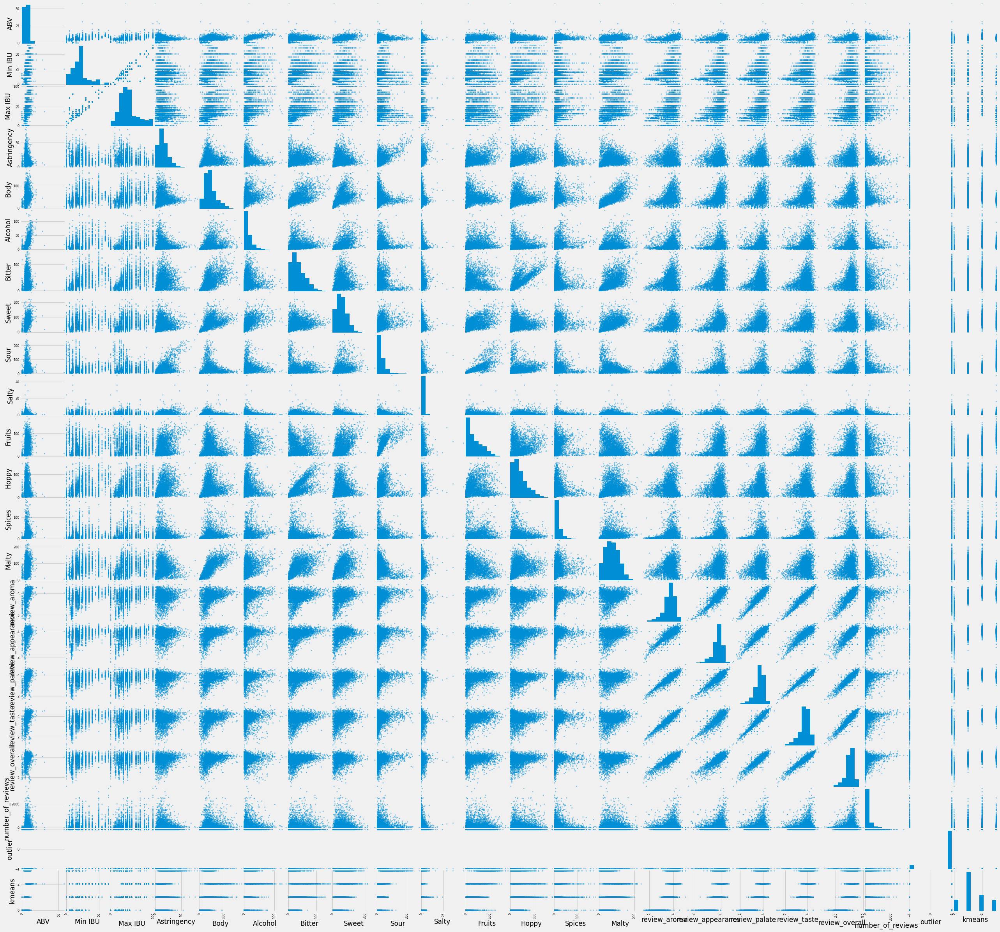

In [29]:
scatter_matrix(beers_data, figsize=(40,40))

Obserwacje: <br>
'min IBU' skorelowane z 'max IBU' <br>
'Body' skorelowane z 'Malty' <br>
'Sour' skoreowane z 'Fruits' <br>
Wszystkie reviews są skorelowane ze sobą <br> 

Salty- jest tylko kilka obserwacji, które bardzo odstają <br>

Wyłaniają się ewidentnie dwa klastry: <br>
'Bitter' i 'Hoppy' <br>
'Body' i 'Fruits' <br>
'Body' i 'Hoppy' <br>
'Body' i 'Sweet' <br>
'Body' i 'Alkohol' <br>
'Sour' i 'Fruits' (skorelowane i nieskorelowane)

#### 3.2 Outliers
Znajdowanie outlierów metodą Isolation Forest i przedstawienie ich na scatter_matrix.

In [15]:
beers_data[beers_data.columns].head()

,,,ABV,Min IBU,Max IBU,Astringency,Body,Alcohol,Bitter,Sweet,Sour,Salty,Fruits,Hoppy,Spices,Malty,review_aroma,review_appearance,review_palate,review_taste,review_overall,number_of_reviews
Name,Brewery,Style,,,,,,,,,,,,,,,,,,,,
Amber,Alaskan Brewing Co.,Altbier,5.3,25,50,13,32,9,47,74,33,0,33,57,8.0,111,3.498994,3.636821,3.556338,3.643863,3.847082,497
Double Bag,Long Trail Brewing Co.,Altbier,7.2,25,50,12,57,18,33,55,16,0,24,35,12.0,84,3.798337,3.846154,3.904366,4.024948,4.034304,481
Long Trail Ale,Long Trail Brewing Co.,Altbier,5.0,25,50,14,37,6,42,43,11,0,10,54,4.0,62,3.409814,3.667109,3.600796,3.631300,3.830239,377
Doppelsticke,Uerige Obergärige Hausbrauerei GmbH / Zum Uerige,Altbier,8.5,25,50,13,55,31,47,101,18,1,49,40,16.0,119,4.148098,4.033967,4.150815,4.205163,4.005435,368
Sleigh'r Dark Doüble Alt Ale,Ninkasi Brewing Company,Altbier,7.2,25,50,25,51,26,44,45,9,1,11,51,20.0,95,3.625000,3.973958,3.734375,3.765625,3.817708,96


In [17]:
clf = IsolationForest(random_state=0)
beer_data_iso = beers_data[beers_data.columns].to_numpy().astype(float)
clf.fit(beer_data_iso)
beers_data['outlier'] = clf.predict(beer_data_iso)
beers_data[beers_data['outlier'] == -1].head()

,,,ABV,Min IBU,Max IBU,Astringency,Body,Alcohol,Bitter,Sweet,Sour,Salty,...,Hoppy,Spices,Malty,review_aroma,review_appearance,review_palate,review_taste,review_overall,number_of_reviews,outlier
Name,Brewery,Style,,,,,,,,,,,,,,,,,,,,,
Olde School Barleywine,Dogfish Head Brewery,Barleywine - American,15.0,60,100,20,55,82,56,170,30,0,...,43,13.0,62,3.902411,3.932262,3.901837,3.931688,3.704363,871,-1
Brewer's Reserve Bourbon Barrel Barleywine,Central Waters Brewing Company,Barleywine - American,14.3,60,100,11,65,94,40,142,25,0,...,23,27.0,133,4.369205,4.072848,4.193709,4.307947,4.091060,302,-1
Old Ruffian,Great Divide Brewing Company,Barleywine - American,10.2,60,100,6,55,31,107,97,27,1,...,120,14.0,119,4.238552,4.318956,4.231629,4.285942,4.071885,939,-1
Old Horizontal,Victory Brewing Company,Barleywine - American,11.0,60,100,9,49,45,78,83,36,1,...,97,12.0,117,4.051918,4.075772,4.084191,4.144060,3.963517,1069,-1
Behemoth,Three Floyds Brewing Co. & Brewpub,Barleywine - American,10.5,60,100,18,71,52,90,125,72,0,...,105,24.0,105,4.207373,4.123272,4.187788,4.264977,4.059908,434,-1


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000019C35650910>,
      dtype=object)

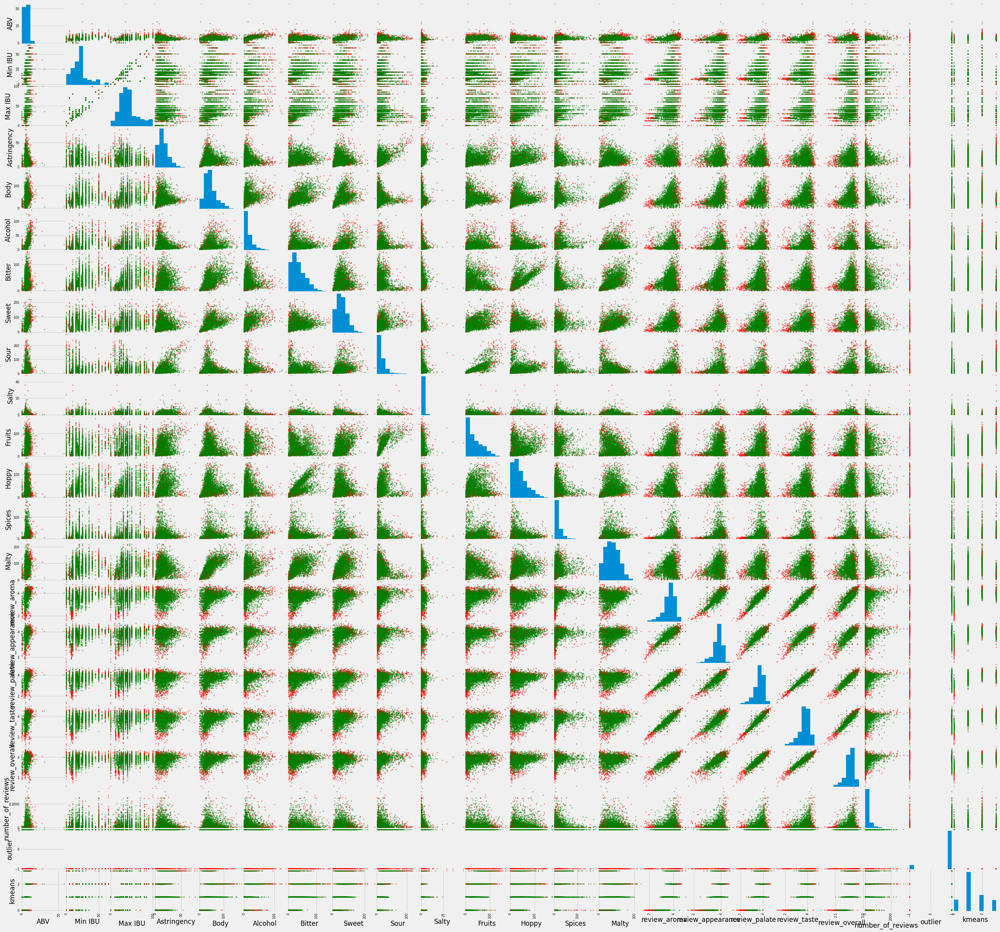

In [30]:
colors = ['Red', 'Green']
scatter_matrix(beers_data, figsize=(40,40), c=beers_data['outlier'], cmap=matplotlib.colors.ListedColormap(colors))

### 4. Clusterization


#### 4.1 K-Means

Klasteryzacja metodą k-means, znalezienie najlepszej liczby klastrów (4) i przedstawienie klastrów na scatter_matrix.

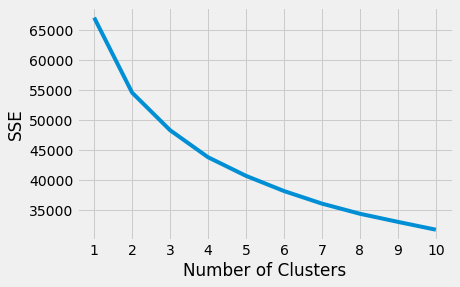

4

In [21]:
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_features = scaler.fit_transform(beers_data)

kmeans_kwargs = {
    "init" : "random",
    "n_init" : 10,
    "max_iter" : 300,
    "random_state" : 42,
}

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_features)
    sse.append(kmeans.inertia_)

plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

kl = KneeLocator(
    range(1, 11), sse, curve="convex", direction="decreasing"
)
kl.elbow

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000019C47957A30>,
      dtype=object)

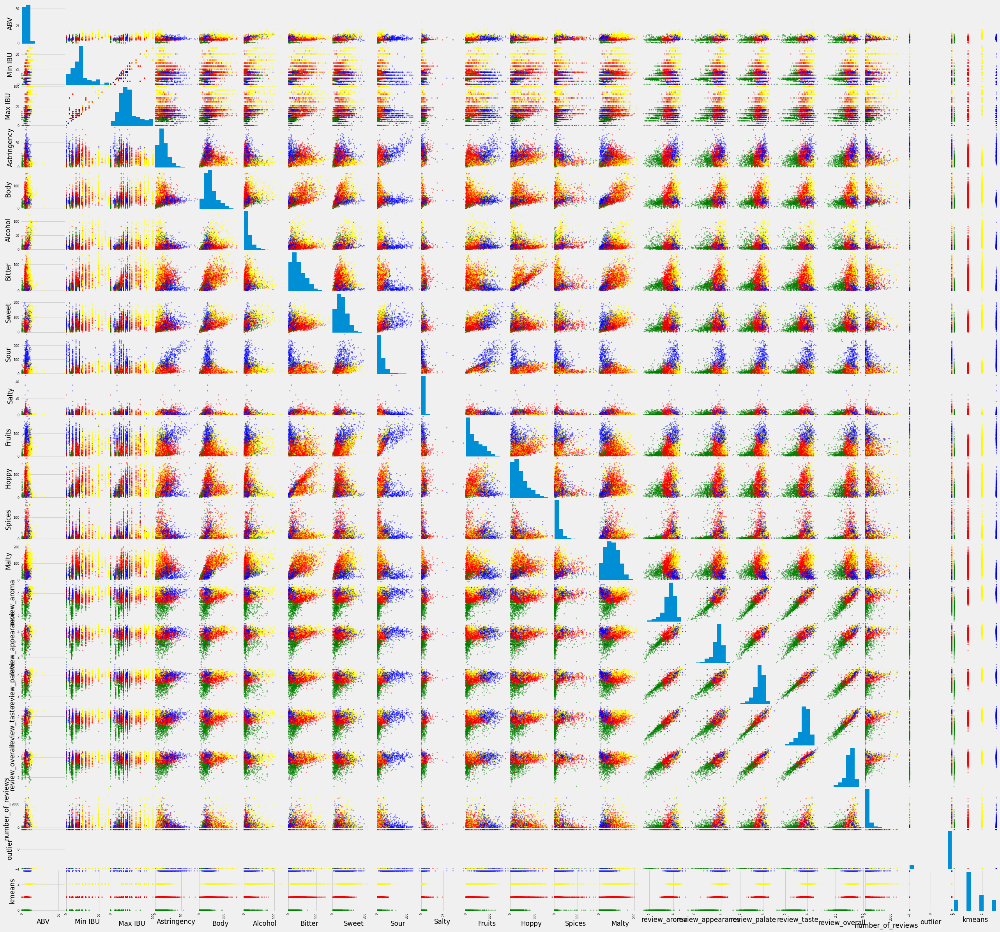

In [31]:
kmeans = KMeans(n_clusters=4, **kmeans_kwargs)
kmeans.fit(scaled_features)
beers_data['kmeans'] = kmeans.predict(scaled_features)

colors = {'Red', 'Green', 'Blue', 'Yellow'}
scatter_matrix(beers_data, figsize=(40,40), c=beers_data['kmeans'], cmap=matplotlib.colors.ListedColormap(colors))

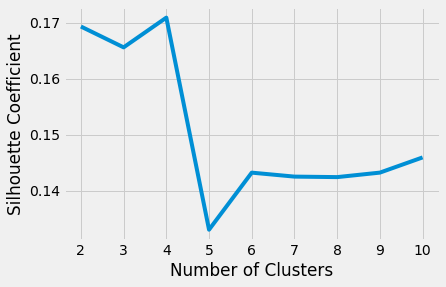

In [23]:
# A list holds the silhouette coefficients for each k
silhouette_coefficients = []
# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(scaled_features)
    score = silhouette_score(scaled_features, kmeans.labels_)
    silhouette_coefficients.append(score)

plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

#### 4.2 DBSCAN

In [25]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons
from sklearn.metrics import adjusted_rand_score

# Instantiate k-means and dbscan algorithms
kmeans = KMeans(n_clusters=4)
dbscan = DBSCAN(eps=1)

# Fit the algorithms to the features
kmeans.fit(scaled_features)
dbscan.fit(scaled_features)

# Compute the silhouette scores for each algorithm
kmeans_silhouette = silhouette_score(
    scaled_features, kmeans.labels_
).round(2)
dbscan_silhouette = silhouette_score(
   scaled_features, dbscan.labels_
).round(2)

In [26]:
kmeans_silhouette

0.17

In [27]:
dbscan_silhouette

-0.24

### 5. Classification